In [1]:
import os, glob, shutil, math, json, datetime
from pathlib import Path

import numpy as np
import PIL.Image as Image
from PIL import UnidentifiedImageError
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from collections import defaultdict


In [2]:
if torch.cuda.is_available():
    print("The code will run on GPU.")
else:
    print("The code will run on CPU. Go to Edit->Notebook Settings and choose GPU as the hardware accelerator")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


The code will run on GPU.


In [3]:
# Colab Drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
# Utils
def timestamp():
    return datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

OUTDIR = Path(f"/content/outputs/{timestamp()}")
OUTDIR.mkdir(parents=True, exist_ok=True)
print("Saving artifacts to:", OUTDIR)

Saving artifacts to: /content/outputs/20250927_170318


In [5]:
# Cell 2: config
ROOT = Path('/content/drive/MyDrive/IDLCV/hotdog_nothotdog')  # 数据根目录（含 train/ test/）
IMG = 224                 # 也可用 128
BATCH = 64
WORKERS = 2

# 训练配置
EPOCHS = 10
LR = 1e-3
OPTIMIZER = 'adam'        # 'adam' or 'sgd'
SCHEDULER = 'cosine'      # 'cosine' or 'step'

# 归一化与增强
USE_DATASET_NORM = False   # True=用训练集统计的 mean/std；False=用 ImageNet 常量
# AUGMENT_KEY = "G_hflip_P_light_R_erasing"
AUGMENT_KEY = "Baseline_RESIZE"


# 显著图
SALIENCY_K = 8
SALIENCY_SIGMA = 0.15
SALIENCY_N = 20


In [11]:
# 新增：可复现随机性
import random
SEED = 42
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [6]:
# dataset class
class Hotdog_NotHotdog(torch.utils.data.Dataset):
    def __init__(self, train, transform, data_path=ROOT):
        self.transform = transform
        data_path = os.path.join(str(data_path), 'train' if train else 'test')
        image_classes = [os.path.split(d)[1] for d in glob.glob(data_path+'/*') if os.path.isdir(d)]
        image_classes.sort()
        self.name_to_label = {c:i for i,c in enumerate(image_classes)}
        # 匹配多种扩展名
        self.image_paths = []
        for ext in ('*.jpg','*.jpeg','*.png','*.JPG','*.JPEG','*.PNG'):
            self.image_paths += glob.glob(os.path.join(data_path, '*', ext))
        self.image_paths.sort()

    def __len__(self): return len(self.image_paths)

    def __getitem__(self, idx):
        p = self.image_paths[idx]
        with Image.open(p) as im:
            im = im.convert('RGB')
        c = os.path.split(os.path.split(p)[0])[1]
        y = self.name_to_label[c]
        X = self.transform(im)
        return X, y


In [7]:
# scan & clean
def scan_and_clean_dataset(root):
    root = Path(root)
    broken_dir = root / "_broken"
    broken_dir.mkdir(exist_ok=True)

    stats = {}
    bad_files = []

    for split in ['train', 'test']:
        stats[split] = {}
        split_dir = root / split
        classes = [d.name for d in split_dir.iterdir() if d.is_dir()]
        for c in sorted(classes):
            cls_dir = split_dir / c
            files = sum([list(cls_dir.glob(pat)) for pat in ('*.jpg','*.jpeg','*.png','*.JPG','*.JPEG','*.PNG')], [])
            ok = 0
            for fp in files:
                try:
                    with Image.open(fp) as im:
                        im.verify()
                    ok += 1
                except (UnidentifiedImageError, OSError):
                    bad_files.append(fp)
            stats[split][c] = ok

    for fp in bad_files:
        target = broken_dir / fp.name
        shutil.move(str(fp), target)

    print(f"[SCAN] Done. Moved {len(bad_files)} broken files to: {broken_dir}")
    return stats

def pretty_print_stats(stats):
    print("Dataset summary:")
    for split, d in stats.items():
        total = sum(d.values())
        print(f"  {split}: total={total}")
        for c, n in d.items():
            print(f"    - {c}: {n}")

stats = scan_and_clean_dataset(ROOT)
pretty_print_stats(stats)


[SCAN] Done. Moved 0 broken files to: /content/drive/MyDrive/IDLCV/hotdog_nothotdog/_broken
Dataset summary:
  train: total=2047
    - hotdog: 1075
    - nothotdog: 972
  test: total=1862
    - hotdog: 895
    - nothotdog: 967


In [8]:
# Cell 5: compute mean/std
import torchvision.transforms as T

@torch.no_grad()
def calc_mean_std(loader, max_batches=None):
    psum = torch.zeros(3); psq = torch.zeros(3); cnt = 0
    for i, (x, _) in enumerate(loader):
        if max_batches is not None and i >= max_batches: break
        b,c,h,w = x.shape
        x = x.view(b, c, -1)
        psum += x.sum(dim=[0,2])
        psq  += (x**2).sum(dim=[0,2])
        cnt  += b*h*w
    mean = psum / cnt
    var  = psq  / cnt - mean**2
    std  = torch.sqrt(var.clamp_min(1e-12))
    return mean.tolist(), std.tolist()

# 暂时先不Normalize，只Resize+ToTensor便于统计
pre_tfms = T.Compose([T.Resize(256), T.CenterCrop(IMG), T.ToTensor()])
tmp_loader = DataLoader(Hotdog_NotHotdog(train=True, transform=pre_tfms, data_path=ROOT),
                        batch_size=64, shuffle=False, num_workers=WORKERS)

if USE_DATASET_NORM:
    TRAINSET_MEAN, TRAINSET_STD = calc_mean_std(tmp_loader)
    EVALSET_MEAN,   EVALSET_STD = TRAINSET_MEAN, TRAINSET_STD
else:
    TRAINSET_MEAN, TRAINSET_STD = [0.485,0.456,0.406], [0.229,0.224,0.225]
    EVALSET_MEAN,   EVALSET_STD = TRAINSET_MEAN, TRAINSET_STD

print("mean:", TRAINSET_MEAN, "std:", TRAINSET_STD)
with open(OUTDIR/"norm.json","w") as f:
    json.dump({"mean":TRAINSET_MEAN,"std":TRAINSET_STD}, f, indent=2)


mean: [0.485, 0.456, 0.406] std: [0.229, 0.224, 0.225]


In [9]:
# Cell 6: augmentation dictionary + eval transform
def build_transforms(img_size=IMG, augment_key="Baseline_RESIZE"):
    base_tfms_list = [transforms.RandomResizedCrop(img_size, scale=(1.0,1.0))]
    common_train = [transforms.ToTensor(), transforms.Normalize(TRAINSET_MEAN, TRAINSET_STD)]

    eval_tfms = transforms.Compose([
        transforms.Resize(256), transforms.CenterCrop(img_size),
        transforms.ToTensor(), transforms.Normalize(EVALSET_MEAN, EVALSET_STD)
    ])

    train_tfms = {
        "Baseline_RESIZE": transforms.Compose([transforms.Resize(256), transforms.CenterCrop(img_size),
                                               transforms.ToTensor(), transforms.Normalize(TRAINSET_MEAN, TRAINSET_STD)]),
        "Baseline": transforms.Compose(base_tfms_list + common_train),
        "G_hflip": transforms.Compose(base_tfms_list + [transforms.RandomHorizontalFlip(0.5)] + common_train),
        "G_rot": transforms.Compose(base_tfms_list + [transforms.RandomRotation(10, fill=0)] + common_train),
        "P_light": transforms.Compose(base_tfms_list + [transforms.RandomApply([transforms.ColorJitter(0.15,0.15,0.15,0.03)], p=0.4)] + common_train),
        "P_med": transforms.Compose(base_tfms_list + [transforms.RandomApply([transforms.ColorJitter(0.3,0.3,0.3,0.08)], p=0.6)] + common_train),
        "G_gaussian_blur": transforms.Compose(base_tfms_list + [transforms.GaussianBlur(kernel_size=(5,5), sigma=(0.1,2.0))] + common_train),
        "R_erasing": transforms.Compose(base_tfms_list + [transforms.RandomHorizontalFlip(0.5)] + common_train + [
            transforms.RandomErasing(p=0.1, scale=(0.02,0.12), ratio=(0.3,3.3), inplace=False)
        ]),
        "G_hflip_P_light_R_erasing": transforms.Compose(base_tfms_list + [
            transforms.RandomHorizontalFlip(0.5),
            transforms.RandomApply([transforms.ColorJitter(0.15,0.15,0.15,0.03)], p=0.4),
        ] + common_train + [
            transforms.RandomErasing(p=0.1, scale=(0.02,0.12), ratio=(0.3,3.3), inplace=False)
        ]),
        "A_autoaugment": transforms.Compose([
            transforms.AutoAugment(transforms.AutoAugmentPolicy.IMAGENET),
            transforms.Resize(256), transforms.CenterCrop(img_size),
            transforms.ToTensor(), transforms.Normalize(TRAINSET_MEAN, TRAINSET_STD),
        ]),
        "A_randaugment": transforms.Compose([
            transforms.RandAugment(num_ops=2, magnitude=9),
            transforms.Resize(256), transforms.CenterCrop(img_size),
            transforms.ToTensor(), transforms.Normalize(TRAINSET_MEAN, TRAINSET_STD),
        ]),
    }
    if augment_key not in train_tfms:
        raise KeyError(f"{augment_key} not in {list(train_tfms.keys())}")
    return train_tfms[augment_key], eval_tfms

train_transform, test_transform = build_transforms(IMG, AUGMENT_KEY)
print("Using augmentation:", AUGMENT_KEY)


Using augmentation: Baseline_RESIZE


In [12]:
# 新增：Cell 7：train/val/test 三分
from torch.utils.data import Subset, DataLoader
import numpy as np

# 构建两个“同源”Dataset（同一文件次序），但 transform 不同：
#  - 训练子集用训练增强（train_transform）
#  - 验证子集用评估风格（test_transform）
full_train_for_train = Hotdog_NotHotdog(train=True,  transform=train_transform, data_path=ROOT)
full_train_for_val   = Hotdog_NotHotdog(train=True,  transform=test_transform,  data_path=ROOT)
testset              = Hotdog_NotHotdog(train=False, transform=test_transform,  data_path=ROOT)

# 80/20 划分索引（可复现）
N = len(full_train_for_train)
idx = np.arange(N)
rng = np.random.default_rng(SEED)
rng.shuffle(idx)
split = int(0.8 * N)
train_idx, val_idx = idx[:split], idx[split:]

# 用相同索引对子集化
train_subset = Subset(full_train_for_train, train_idx)  # 训练增强
val_subset   = Subset(full_train_for_val,   val_idx)    # 验证不做训练增强

# 三个 DataLoader
train_loader = DataLoader(train_subset, batch_size=BATCH, shuffle=True,  num_workers=WORKERS)
val_loader   = DataLoader(val_subset,   batch_size=BATCH, shuffle=False, num_workers=WORKERS)
test_loader  = DataLoader(testset,      batch_size=BATCH, shuffle=False, num_workers=WORKERS)

# 类名（与标签索引一致）
class_names = [k for k,_ in sorted(full_train_for_train.name_to_label.items(), key=lambda kv: kv[1])]

print(f"train/val/test = {len(train_subset)}/{len(val_subset)}/{len(testset)}")


train/val/test = 1637/410/1862


In [13]:
# Cell 8: models
from torchvision import models

class SmallCNN(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32,64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64,128,3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(), nn.Linear(128*(IMG//8)*(IMG//8), 128), nn.ReLU(), nn.Linear(128, 2)
        )
    def forward(self, x): return self.classifier(self.features(x))

def build_model(kind='base', num_classes=2, pretrained=True, freeze_backbone=False):
    if kind == 'base':
        model = SmallCNN(num_classes=num_classes)
    elif kind == 'resnet18':
        m = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1 if pretrained else None)
        if freeze_backbone:
            for p in m.parameters(): p.requires_grad = False
        m.fc = nn.Linear(m.fc.in_features, num_classes)
        model = m
    else:
        raise ValueError("Unknown kind")
    return model.to(device)


In [ ]:
# Cell 9 (REPLACE): training with val early-stop
def accuracy_from_logits(logits, y):
    pred = logits.argmax(dim=1)
    return (pred == y).float().mean().item()

def train_one_model(kind='base', train_loader=None, val_loader=None,
                    epochs=10, lr=1e-3, optimizer_name='adam',
                    scheduler_name='cosine', patience=5,
                    freeze_backbone=False, pretrained=True):
    assert train_loader is not None and val_loader is not None, "need train_loader & val_loader"

    model = build_model(kind, num_classes=2, pretrained=pretrained, freeze_backbone=freeze_backbone)

    if optimizer_name.lower() == 'adam':
        opt = torch.optim.Adam(model.parameters(), lr=lr)
    elif optimizer_name.lower() == 'sgd':
        opt = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.9, nesterov=True)
    else:
        raise ValueError("optimizer_name in {'adam','sgd'}")

    if scheduler_name == 'cosine':
        sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    elif scheduler_name == 'step':
        sched = torch.optim.lr_scheduler.StepLR(opt, step_size=max(1,epochs//3), gamma=0.1)
    else:
        sched = None

    scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
    criterion = nn.CrossEntropyLoss()
    hist = defaultdict(list); best_val_acc = 0.0; best_state = None; wait = 0

    for ep in range(1, epochs+1):
        # ---- train ----
        model.train(); train_loss=train_acc=0.0; n_train=0
        for X, y in train_loader:
            X, y = X.to(device), y.to(device, dtype=torch.long)
            opt.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):
                logits = model(X); loss = criterion(logits, y)
            scaler.scale(loss).backward(); scaler.step(opt); scaler.update()

            train_loss += loss.item()*X.size(0)
            train_acc  += (logits.argmax(1)==y).sum().item()
            n_train    += X.size(0)

        # ---- validate ----
        model.eval(); val_loss=val_acc=0.0; n_val=0
        with torch.no_grad():
            for X,y in val_loader:
                X, y = X.to(device), y.to(device, dtype=torch.long)
                logits = model(X); loss = criterion(logits, y)
                val_loss += loss.item()*X.size(0)
                val_acc  += (logits.argmax(1)==y).sum().item()
                n_val    += X.size(0)

        # epoch end
        train_loss/=max(1,n_train); val_loss/=max(1,n_val)
        train_acc /=max(1,n_train); val_acc /=max(1,n_val)
        hist['train_loss'].append(train_loss); hist['val_loss'].append(val_loss)
        hist['train_acc'].append(train_acc);  hist['val_acc'].append(val_acc)

        if sched: sched.step()  # <-- step at epoch end

        # early stop on val
        if val_acc > best_val_acc + 1e-4:
            best_val_acc = val_acc
            best_state = {k:v.cpu().clone() for k,v in model.state_dict().items()}
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                print(f"[EarlyStop] epoch={ep}, best_val_acc={best_val_acc:.4f}")
                break

        print(f"Epoch {ep:03d}  loss {train_loss:.4f}/{val_loss:.4f}  acc {train_acc:.3f}/{val_acc:.3f}")

    if best_state is not None:
        model.load_state_dict(best_state)
        torch.save(best_state, OUTDIR/"best.ckpt")

    return model, hist, best_val_acc

def plot_curves(hists, labels, title="Training curves"):
    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    for h,lab in zip(hists, labels):
        plt.plot(h['train_loss'], label=f"{lab}-train")
        plt.plot(h['val_loss'],   label=f"{lab}-val", linestyle='--')
    plt.xlabel("epoch"); plt.ylabel("loss"); plt.title(title+" (loss)"); plt.legend(); plt.grid(alpha=0.3)
    plt.subplot(1,2,2)
    for h,lab in zip(hists, labels):
        plt.plot(h['train_acc'], label=f"{lab}-train")
        plt.plot(h['val_acc'],   label=f"{lab}-val", linestyle='--')
    plt.xlabel("epoch"); plt.ylabel("accuracy"); plt.title(title+" (acc)"); plt.legend(); plt.grid(alpha=0.3)
    plt.tight_layout(); plt.savefig(OUTDIR/"curves.png"); plt.show()


In [16]:
# Eval helper (drop-in)
import math, numpy as np, matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

def eval_and_report(model, loader, class_names=None, max_show=16):
    model.eval()
    all_y, all_p = [], []
    wrong_imgs, wrong_pred_true = [], []
    with torch.no_grad():
        for X, y in loader:
            X = X.to(device); y = y.to(device)
            logits = model(X)
            p = logits.argmax(1)
            all_y.append(y.cpu().numpy()); all_p.append(p.cpu().numpy())

            mism = (p != y)
            if mism.any():
                xs = X[mism].cpu()
                ys = y[mism].cpu().numpy()
                ps = p[mism].cpu().numpy()
                for i in range(xs.size(0)):
                    if len(wrong_imgs) >= max_show: break
                    wrong_imgs.append(xs[i]); wrong_pred_true.append((ps[i], ys[i]))

    all_y = np.concatenate(all_y); all_p = np.concatenate(all_p)
    acc = float((all_y == all_p).mean())
    print(f"Accuracy: {acc:.4f}\n")
    report_txt = classification_report(all_y, all_p, target_names=class_names, digits=4) if class_names else classification_report(all_y, all_p, digits=4)
    print(report_txt)

    # 保存报告与混淆矩阵
    try:
        (OUTDIR).mkdir(parents=True, exist_ok=True)
        with open(OUTDIR / "classification_report.txt","w") as f:
            f.write(f"Accuracy: {acc:.4f}\n\n{report_txt}")
        cm = confusion_matrix(all_y, all_p)
        disp = ConfusionMatrixDisplay(cm, display_labels=class_names if class_names else None)
        fig, ax = plt.subplots(figsize=(4,4)); disp.plot(ax=ax, colorbar=False, values_format='d')
        plt.tight_layout(); plt.savefig(OUTDIR/"confusion_matrix.png"); plt.show()
    except Exception as e:
        print("[warn] save artifacts failed:", e)

    # 误分拼贴（最多 max_show 张）
    if wrong_imgs:
        k = min(max_show, len(wrong_imgs)); cols = 8; rows = math.ceil(k/cols)
        plt.figure(figsize=(cols*2, rows*2))
        for i in range(k):
            plt.subplot(rows, cols, i+1)
            img = (wrong_imgs[i]-wrong_imgs[i].min())/(wrong_imgs[i].max()-wrong_imgs[i].min()+1e-6)
            pt  = wrong_pred_true[i]
            ttl = f"pred:{class_names[pt[0]] if class_names else pt[0]}\ntrue:{class_names[pt[1]] if class_names else pt[1]}"
            plt.imshow(img.permute(1,2,0)); plt.axis('off'); plt.title(ttl, fontsize=9)
        plt.suptitle("Misclassified examples"); plt.tight_layout(); plt.savefig(OUTDIR/"misclassified.png"); plt.show()

    return acc


/tmp/ipython-input-2470045350.py:27: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-2470045350.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


Epoch 001  loss 1.7062/0.6351  acc 0.469/0.483
Epoch 002  loss 0.6219/0.5933  acc 0.637/0.673
Epoch 003  loss 0.5644/0.5215  acc 0.721/0.739
Epoch 004  loss 0.5234/0.5114  acc 0.752/0.739
Epoch 005  loss 0.4991/0.5009  acc 0.773/0.759
Epoch 006  loss 0.4652/0.4992  acc 0.788/0.746
Epoch 007  loss 0.4356/0.4907  acc 0.809/0.751
Epoch 008  loss 0.4067/0.4958  acc 0.822/0.751
Epoch 009  loss 0.3884/0.4858  acc 0.831/0.749
[EarlyStop] epoch=10, best_val_acc=0.7585
Epoch 001  loss 0.4748/0.7312  acc 0.823/0.720
Epoch 002  loss 0.2541/0.5215  acc 0.895/0.839
Epoch 003  loss 0.1140/0.5010  acc 0.954/0.849
Epoch 004  loss 0.0936/0.5219  acc 0.960/0.827
Epoch 005  loss 0.0657/0.3385  acc 0.974/0.880
Epoch 006  loss 0.0322/0.3811  acc 0.991/0.890
Epoch 007  loss 0.0117/0.3530  acc 0.997/0.900
Epoch 008  loss 0.0040/0.3418  acc 1.000/0.920
Epoch 009  loss 0.0027/0.3454  acc 1.000/0.920
Epoch 010  loss 0.0022/0.3480  acc 1.000/0.915


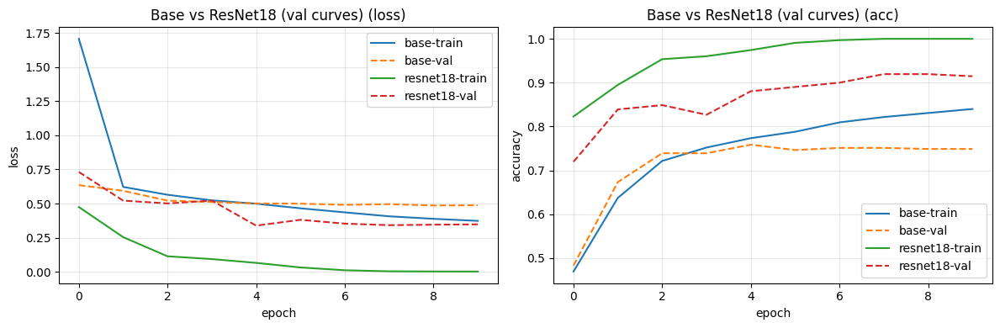

[VAL] best acc  base: 0.759 | resnet18: 0.920

== Base model on TEST ==
Accuracy: 0.7299

              precision    recall  f1-score   support

      hotdog     0.6772    0.8369    0.7486       895
   nothotdog     0.8069    0.6308    0.7081       967

    accuracy                         0.7299      1862
   macro avg     0.7420    0.7338    0.7283      1862
weighted avg     0.7446    0.7299    0.7276      1862



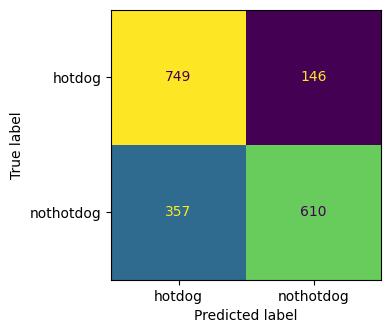

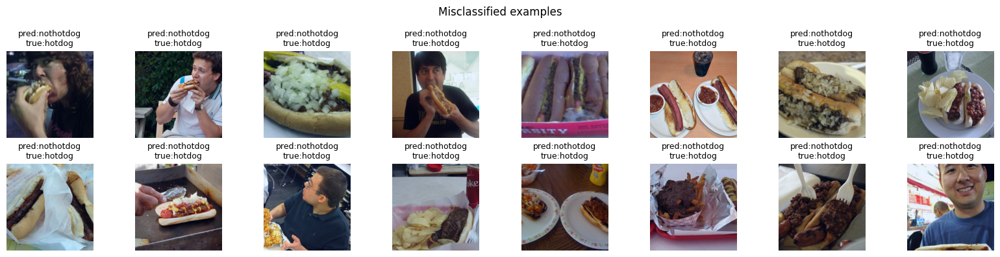


== ResNet18 on TEST ==
Accuracy: 0.8969

              precision    recall  f1-score   support

      hotdog     0.9240    0.8559    0.8886       895
   nothotdog     0.8751    0.9349    0.9040       967

    accuracy                         0.8969      1862
   macro avg     0.8996    0.8954    0.8963      1862
weighted avg     0.8986    0.8969    0.8966      1862



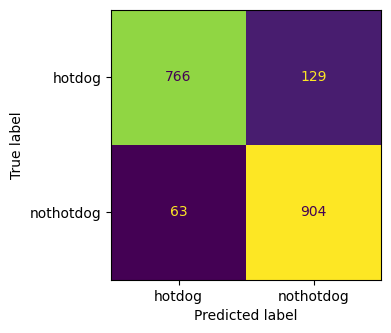

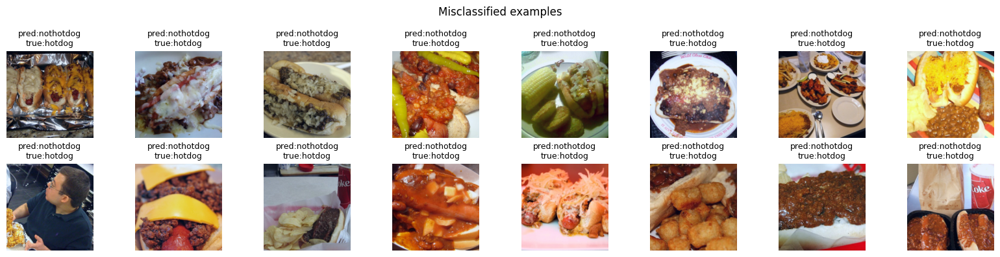

In [17]:
# 修订版 Cell 10：分别在 val/test 上评估
epochs = EPOCHS

model_base, hist_base, best_base = train_one_model(
    kind='base', train_loader=train_loader, val_loader=val_loader,
    epochs=epochs, lr=LR, optimizer_name=OPTIMIZER, scheduler_name=SCHEDULER, patience=5
)
model_res , hist_res , best_res  = train_one_model(
    kind='resnet18', train_loader=train_loader, val_loader=val_loader,
    epochs=epochs, lr=LR, optimizer_name=OPTIMIZER, scheduler_name=SCHEDULER, patience=5
)

plot_curves([hist_base, hist_res], ['base', 'resnet18'], title="Base vs ResNet18 (val curves)")
print(f"[VAL] best acc  base: {best_base:.3f} | resnet18: {best_res:.3f}")

# —— 最终只在 TEST 上报告一次 —— #
print("\n== Base model on TEST ==")
acc_base = eval_and_report(model_base, test_loader, class_names)

print("\n== ResNet18 on TEST ==")
acc_res  = eval_and_report(model_res,  test_loader, class_names)


/tmp/ipython-input-2470045350.py:27: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-2470045350.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


Epoch 001  loss 0.4823/4.6817  acc 0.806/0.763
Epoch 002  loss 0.2543/0.5584  acc 0.888/0.834
Epoch 003  loss 0.1115/0.3143  acc 0.956/0.871
Epoch 004  loss 0.0746/0.4859  acc 0.973/0.829
Epoch 005  loss 0.0460/0.4014  acc 0.985/0.885
Epoch 006  loss 0.0214/0.4379  acc 0.993/0.883
Epoch 007  loss 0.0078/0.3772  acc 0.998/0.900
Epoch 008  loss 0.0052/0.3805  acc 0.998/0.900
Epoch 009  loss 0.0024/0.3739  acc 1.000/0.900
Epoch 010  loss 0.0013/0.3798  acc 1.000/0.900
Accuracy: 0.8969

              precision    recall  f1-score   support

      hotdog     0.8972    0.8872    0.8921       895
   nothotdog     0.8966    0.9059    0.9012       967

    accuracy                         0.8969      1862
   macro avg     0.8969    0.8965    0.8967      1862
weighted avg     0.8969    0.8969    0.8969      1862



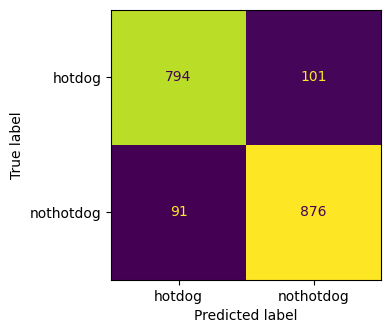

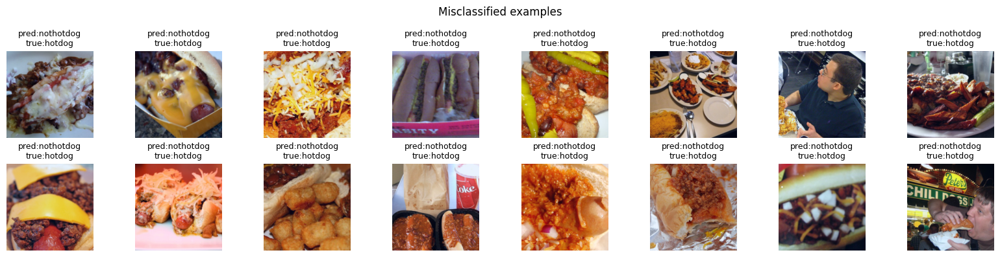

/tmp/ipython-input-2470045350.py:27: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-2470045350.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


Epoch 001  loss 0.4219/0.7045  acc 0.824/0.737
Epoch 002  loss 0.2206/0.6570  acc 0.906/0.837
Epoch 003  loss 0.1441/0.6487  acc 0.946/0.841
Epoch 004  loss 0.1501/0.6034  acc 0.939/0.800
Epoch 005  loss 0.0804/0.4304  acc 0.971/0.846
Epoch 006  loss 0.0464/0.3714  acc 0.983/0.888
Epoch 007  loss 0.0248/0.4554  acc 0.992/0.863
Epoch 008  loss 0.0223/0.3957  acc 0.993/0.876
Epoch 009  loss 0.0081/0.3879  acc 0.999/0.893
Epoch 010  loss 0.0069/0.3879  acc 1.000/0.890
Accuracy: 0.9071

              precision    recall  f1-score   support

      hotdog     0.9178    0.8860    0.9016       895
   nothotdog     0.8978    0.9266    0.9120       967

    accuracy                         0.9071      1862
   macro avg     0.9078    0.9063    0.9068      1862
weighted avg     0.9074    0.9071    0.9070      1862



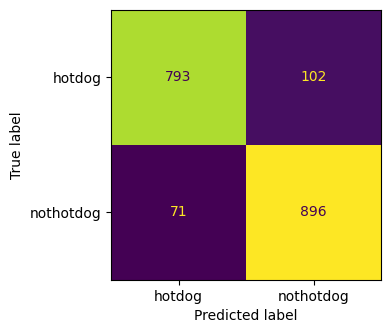

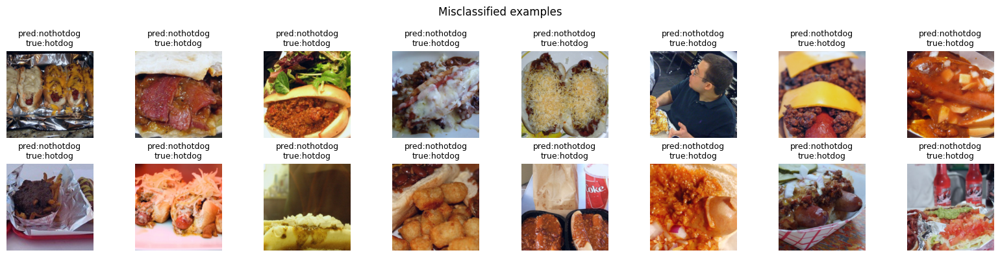

/tmp/ipython-input-2470045350.py:27: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-2470045350.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


Epoch 001  loss 0.5491/0.6210  acc 0.787/0.834
Epoch 002  loss 0.2839/0.6009  acc 0.874/0.771
Epoch 003  loss 0.2118/0.3520  acc 0.911/0.859
Epoch 004  loss 0.1751/0.4182  acc 0.929/0.856
Epoch 005  loss 0.1544/0.3716  acc 0.944/0.868
Epoch 006  loss 0.0853/0.3818  acc 0.966/0.861
Epoch 007  loss 0.0534/0.3977  acc 0.980/0.868
Epoch 008  loss 0.0421/0.3672  acc 0.987/0.883
Epoch 009  loss 0.0291/0.2874  acc 0.993/0.902
Epoch 010  loss 0.0249/0.2902  acc 0.994/0.902
Accuracy: 0.9082

              precision    recall  f1-score   support

      hotdog     0.9209    0.8849    0.9026       895
   nothotdog     0.8972    0.9297    0.9132       967

    accuracy                         0.9082      1862
   macro avg     0.9091    0.9073    0.9079      1862
weighted avg     0.9086    0.9082    0.9081      1862



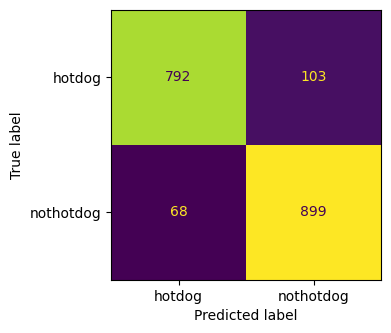

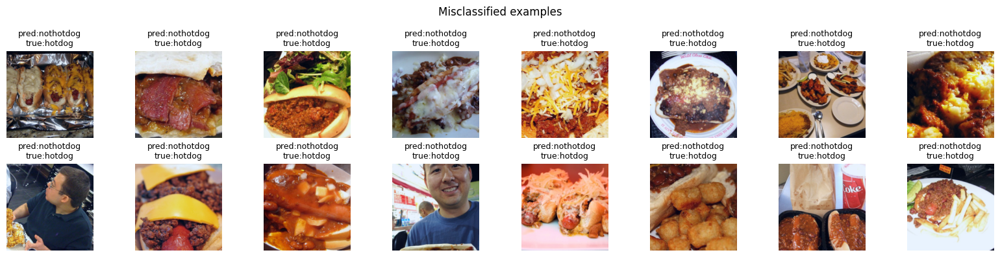

,Aug,Val_Acc,Test_Acc
0,Baseline_RESIZE,0.900000,0.896885
1,LightCombo,0.892683,0.907089
2,RandAugment,0.902439,0.908163


/tmp/ipython-input-2470045350.py:27: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-2470045350.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


Epoch 001  loss 0.4380/1.2311  acc 0.823/0.785
Epoch 002  loss 0.2212/0.6049  acc 0.917/0.751
Epoch 003  loss 0.1377/0.5159  acc 0.948/0.824
Epoch 004  loss 0.0819/0.4353  acc 0.969/0.873
Epoch 005  loss 0.0403/0.3190  acc 0.984/0.905
Epoch 006  loss 0.0149/0.3783  acc 0.997/0.910
Epoch 007  loss 0.0144/0.3395  acc 0.994/0.917
Epoch 008  loss 0.0057/0.3475  acc 1.000/0.910
Epoch 009  loss 0.0039/0.3580  acc 0.999/0.910
Epoch 010  loss 0.0021/0.3537  acc 1.000/0.905
Accuracy: 0.9033

              precision    recall  f1-score   support

      hotdog     0.9312    0.8626    0.8956       895
   nothotdog     0.8809    0.9411    0.9100       967

    accuracy                         0.9033      1862
   macro avg     0.9061    0.9018    0.9028      1862
weighted avg     0.9051    0.9033    0.9031      1862



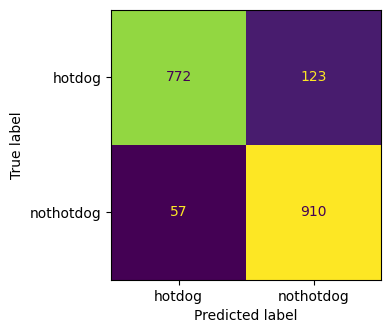

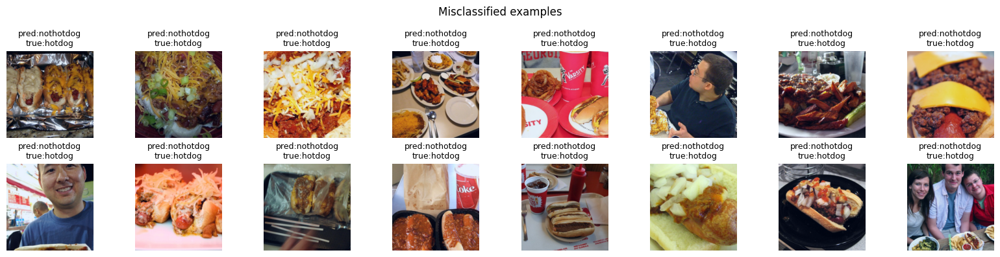

/tmp/ipython-input-2470045350.py:27: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-2470045350.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


Epoch 001  loss 0.4590/0.8062  acc 0.816/0.754
Epoch 002  loss 0.2875/0.3921  acc 0.885/0.820
Epoch 003  loss 0.1887/0.6538  acc 0.924/0.759
Epoch 004  loss 0.0931/0.3673  acc 0.966/0.885
Epoch 005  loss 0.0492/0.3382  acc 0.990/0.898
Epoch 006  loss 0.0370/0.3323  acc 0.991/0.890
Epoch 007  loss 0.0241/0.3334  acc 0.997/0.895
Epoch 008  loss 0.0244/0.3357  acc 0.995/0.893
Epoch 009  loss 0.0231/0.3374  acc 0.996/0.893
[EarlyStop] epoch=10, best_val_acc=0.8976
Accuracy: 0.9028

              precision    recall  f1-score   support

      hotdog     0.9029    0.8939    0.8984       895
   nothotdog     0.9027    0.9111    0.9068       967

    accuracy                         0.9028      1862
   macro avg     0.9028    0.9025    0.9026      1862
weighted avg     0.9028    0.9028    0.9028      1862



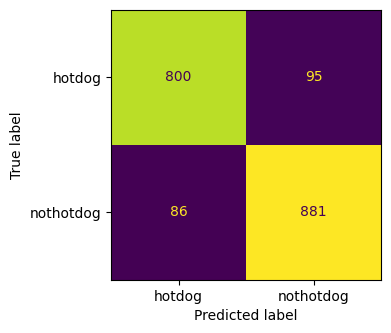

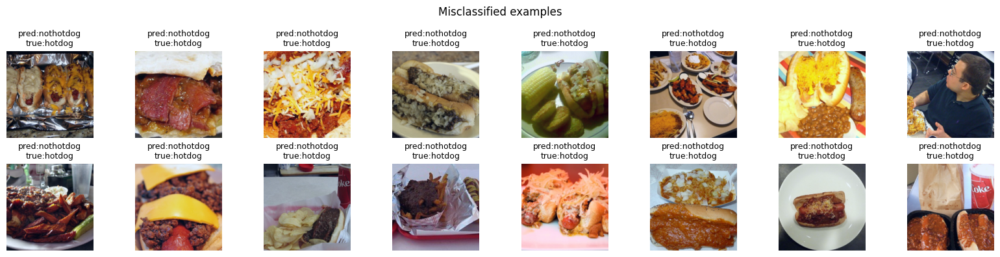

/tmp/ipython-input-2470045350.py:27: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-2470045350.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


Epoch 001  loss 0.4193/0.2986  acc 0.806/0.859
Epoch 002  loss 0.1952/0.2268  acc 0.932/0.905
Epoch 003  loss 0.1368/0.2020  acc 0.955/0.917
Epoch 004  loss 0.1054/0.1904  acc 0.969/0.920
Epoch 005  loss 0.0895/0.1843  acc 0.978/0.924
Epoch 006  loss 0.0749/0.1828  acc 0.984/0.922
Epoch 007  loss 0.0686/0.1779  acc 0.986/0.922
Epoch 008  loss 0.0594/0.1756  acc 0.989/0.922
Epoch 009  loss 0.0572/0.1768  acc 0.992/0.922
[EarlyStop] epoch=10, best_val_acc=0.9244
Accuracy: 0.9275

              precision    recall  f1-score   support

      hotdog     0.9185    0.9318    0.9251       895
   nothotdog     0.9361    0.9235    0.9297       967

    accuracy                         0.9275      1862
   macro avg     0.9273    0.9277    0.9274      1862
weighted avg     0.9276    0.9275    0.9275      1862



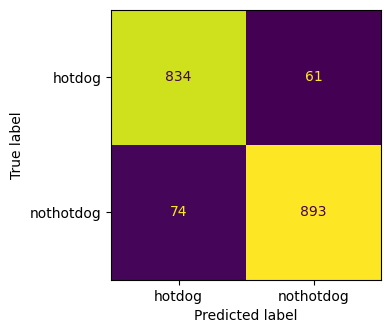

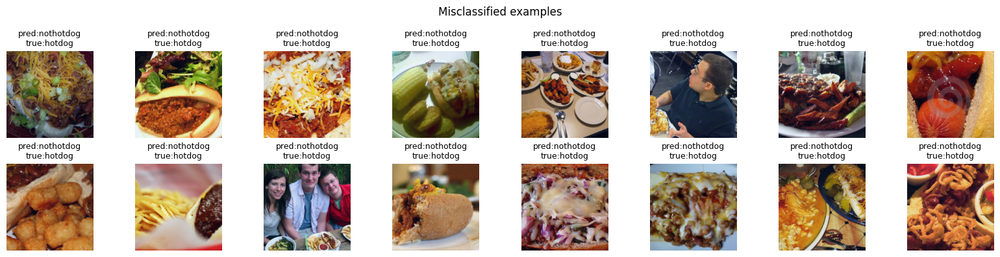

/tmp/ipython-input-2470045350.py:27: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-2470045350.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


Epoch 001  loss 0.4215/0.2976  acc 0.798/0.863
Epoch 002  loss 0.1963/0.2107  acc 0.921/0.924
Epoch 003  loss 0.1331/0.1942  acc 0.957/0.932
Epoch 004  loss 0.1042/0.1955  acc 0.971/0.932
Epoch 005  loss 0.1026/0.1932  acc 0.973/0.932
Epoch 006  loss 0.1025/0.1914  acc 0.968/0.932
Epoch 007  loss 0.1012/0.1933  acc 0.974/0.924
[EarlyStop] epoch=8, best_val_acc=0.9317
Accuracy: 0.9237

              precision    recall  f1-score   support

      hotdog     0.9254    0.9151    0.9202       895
   nothotdog     0.9222    0.9317    0.9270       967

    accuracy                         0.9237      1862
   macro avg     0.9238    0.9234    0.9236      1862
weighted avg     0.9238    0.9237    0.9237      1862



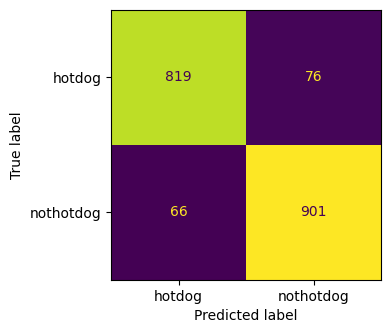

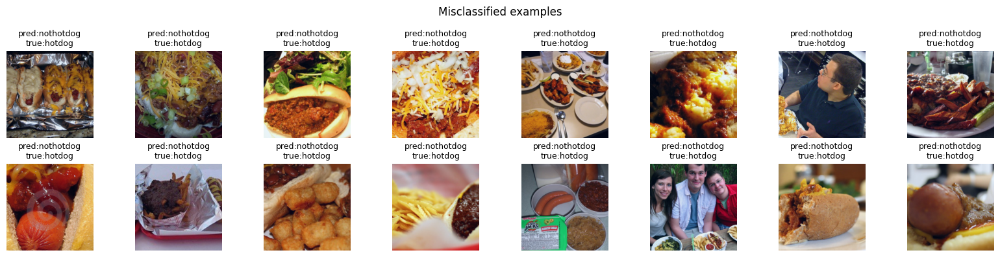

,Setting,Val_Acc,Test_Acc
0,Adam + Cosine,0.917073,0.903330
1,Adam + StepLR,0.897561,0.902793
2,SGD + Cosine,0.924390,0.927497
3,SGD + StepLR,0.931707,0.923738


/tmp/ipython-input-1348286525.py:102: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-1348286525.py:111: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


[SmallCNN] epoch 01 acc 0.564/0.644
[SmallCNN] epoch 02 acc 0.728/0.751
[SmallCNN] epoch 03 acc 0.765/0.756
[SmallCNN] epoch 04 acc 0.788/0.741
[SmallCNN] epoch 05 acc 0.812/0.741
[SmallCNN] epoch 06 acc 0.852/0.778
[SmallCNN] epoch 07 acc 0.881/0.807
[SmallCNN] epoch 08 acc 0.909/0.798
[SmallCNN] epoch 09 acc 0.930/0.780
[SmallCNN] epoch 10 acc 0.935/0.807
[SmallCNN] epoch 01 acc 0.586/0.734
[SmallCNN] epoch 02 acc 0.690/0.768
[SmallCNN] epoch 03 acc 0.718/0.751
[SmallCNN] epoch 04 acc 0.721/0.776
[SmallCNN] epoch 05 acc 0.739/0.766
[SmallCNN] epoch 06 acc 0.752/0.754
[SmallCNN] epoch 07 acc 0.751/0.776
[SmallCNN] epoch 08 acc 0.768/0.773
Accuracy: 0.7519

              precision    recall  f1-score   support

      hotdog     0.7341    0.7587    0.7462       895
   nothotdog     0.7695    0.7456    0.7574       967

    accuracy                         0.7519      1862
   macro avg     0.7518    0.7521    0.7518      1862
weighted avg     0.7525    0.7519    0.7520      1862



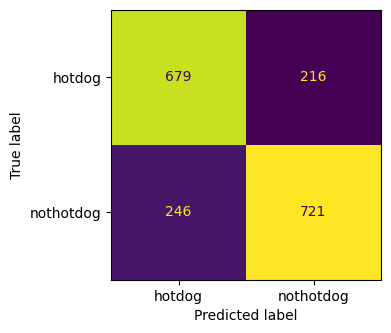

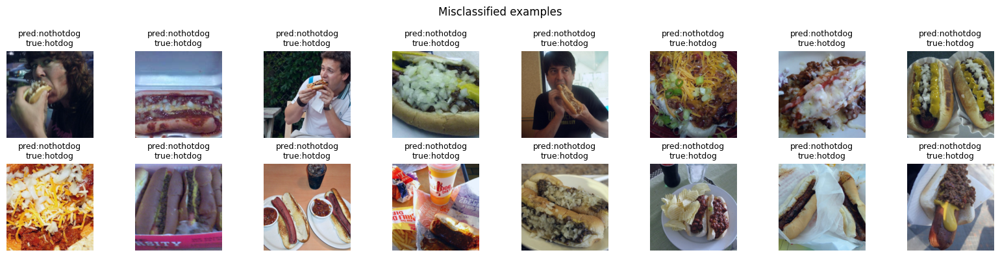

Accuracy: 0.7266

              precision    recall  f1-score   support

      hotdog     0.6732    0.8380    0.7466       895
   nothotdog     0.8061    0.6236    0.7032       967

    accuracy                         0.7266      1862
   macro avg     0.7397    0.7308    0.7249      1862
weighted avg     0.7423    0.7266    0.7241      1862



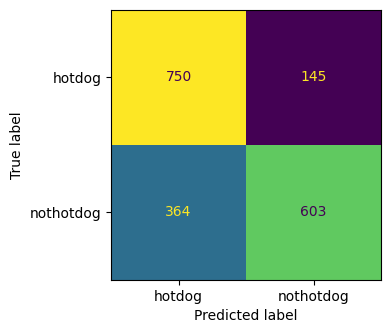

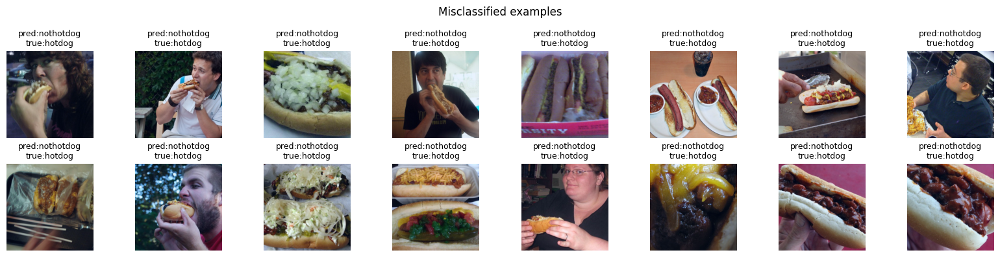

,Model,Val_Acc,Test_Acc
0,SmallCNN,0.807317,0.751880
1,SmallCNN_BN+Dropout,0.775610,0.726638


/tmp/ipython-input-1348286525.py:102: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-1348286525.py:111: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


[SmallCNN] epoch 01 acc 0.826/0.720
[SmallCNN] epoch 02 acc 0.892/0.876
[SmallCNN] epoch 03 acc 0.952/0.812
[SmallCNN] epoch 04 acc 0.966/0.851
[SmallCNN] epoch 05 acc 0.981/0.785
[SmallCNN] epoch 06 acc 0.985/0.876
Accuracy: 0.8668

              precision    recall  f1-score   support

      hotdog     0.8847    0.8313    0.8571       895
   nothotdog     0.8521    0.8997    0.8753       967

    accuracy                         0.8668      1862
   macro avg     0.8684    0.8655    0.8662      1862
weighted avg     0.8678    0.8668    0.8665      1862



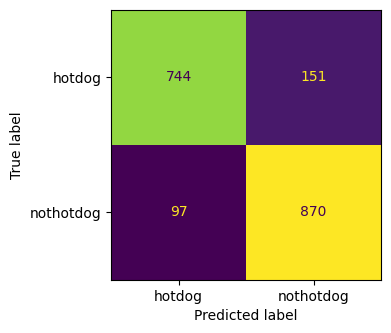

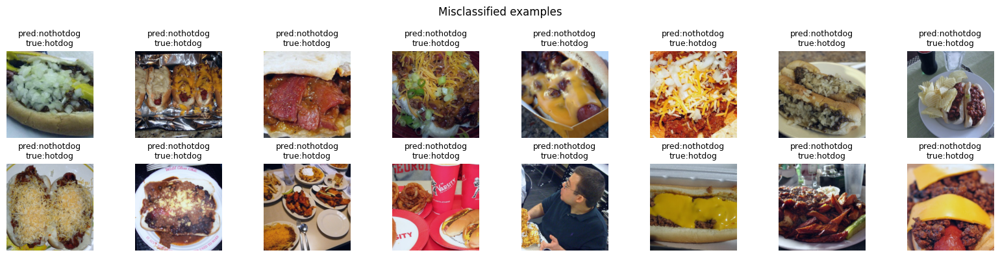

/tmp/ipython-input-1348286525.py:102: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-1348286525.py:111: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


[SmallCNN] epoch 01 acc 0.802/0.846
[SmallCNN] epoch 02 acc 0.891/0.895
[SmallCNN] epoch 03 acc 0.907/0.902
[SmallCNN] epoch 04 acc 0.920/0.917
[SmallCNN] epoch 05 acc 0.927/0.920
[SmallCNN] epoch 06 acc 0.933/0.920
[SmallCNN] epoch 07 acc 0.932/0.927
[SmallCNN] epoch 08 acc 0.941/0.924
[SmallCNN] epoch 09 acc 0.933/0.929
[SmallCNN] epoch 10 acc 0.940/0.932
Accuracy: 0.9259

              precision    recall  f1-score   support

      hotdog     0.9155    0.9318    0.9236       895
   nothotdog     0.9359    0.9204    0.9281       967

    accuracy                         0.9259      1862
   macro avg     0.9257    0.9261    0.9258      1862
weighted avg     0.9261    0.9259    0.9259      1862



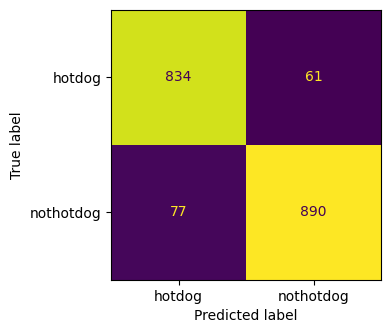

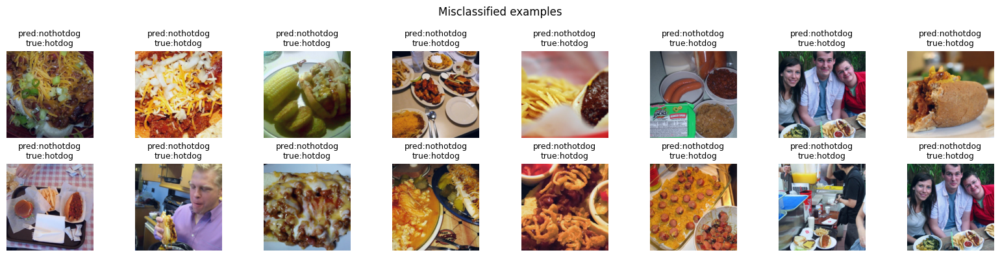

/tmp/ipython-input-1348286525.py:102: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
/tmp/ipython-input-1348286525.py:111: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):


[SmallCNN] epoch 01 acc 0.679/0.693
[SmallCNN] epoch 02 acc 0.765/0.685
[SmallCNN] epoch 03 acc 0.791/0.627
[SmallCNN] epoch 04 acc 0.806/0.729
[SmallCNN] epoch 05 acc 0.806/0.729
[SmallCNN] epoch 06 acc 0.829/0.729
[SmallCNN] epoch 07 acc 0.833/0.759
[SmallCNN] epoch 08 acc 0.849/0.776
[SmallCNN] epoch 09 acc 0.869/0.800
[SmallCNN] epoch 10 acc 0.881/0.802
Accuracy: 0.7884

              precision    recall  f1-score   support

      hotdog     0.7824    0.7754    0.7789       895
   nothotdog     0.7938    0.8004    0.7971       967

    accuracy                         0.7884      1862
   macro avg     0.7881    0.7879    0.7880      1862
weighted avg     0.7884    0.7884    0.7884      1862



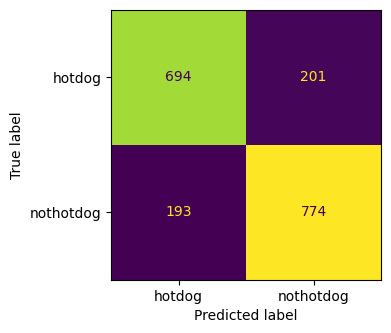

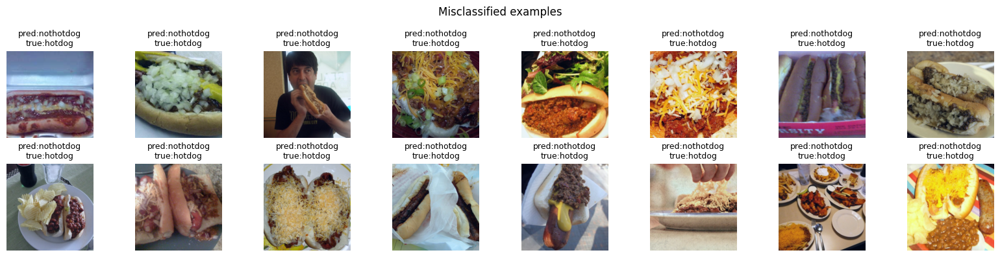

,Setting,Val_Acc,Test_Acc
0,"pretrained=True, freeze=False",0.875610,0.866810
1,"pretrained=True, freeze=True",0.931707,0.925886
2,"pretrained=False, freeze=False",0.802439,0.788400


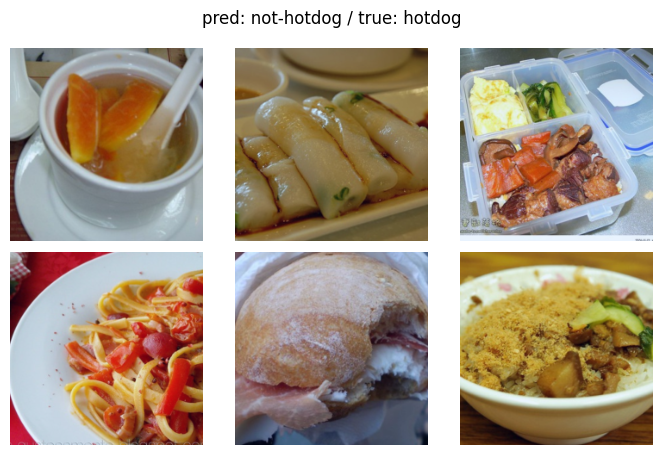

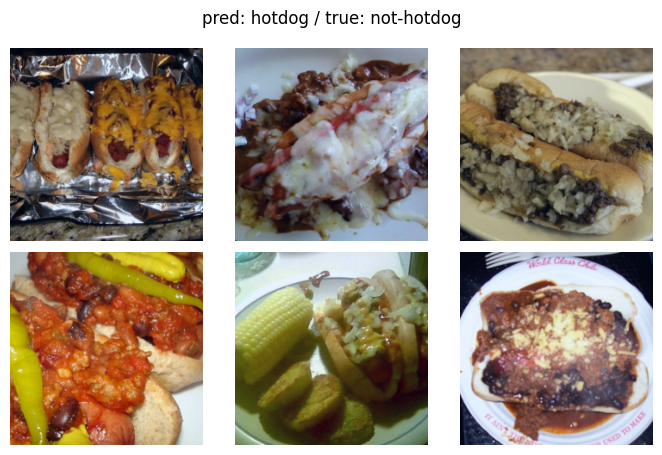

,split,class,count
2,test,hotdog,895
3,test,nothotdog,967
0,train,hotdog,1075
1,train,nothotdog,972


All comparison tables are saved in: /content/outputs/20250927_170318


In [18]:
# All-in-one experiment panel (drop-in)
# 依赖：ROOT, IMG, BATCH, WORKERS, EPOCHS, LR, OPTIMIZER, SCHEDULER, OUTDIR,
#      build_transforms, Hotdog_NotHotdog, eval_and_report, class_names,
#      以及 train_idx / val_idx（80/20 的固定划分）
import math, numpy as np, pandas as pd
from pathlib import Path
from torch.utils.data import Subset, DataLoader
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

OUTDIR.mkdir(parents=True, exist_ok=True)

# 工具：基于 aug key 重建一致划分的 loaders
def make_loaders_with_aug(augment_key):
    train_tf, eval_tf = build_transforms(IMG, augment_key)
    ds_train_for_train = Hotdog_NotHotdog(train=True,  transform=train_tf,  data_path=ROOT)
    ds_train_for_val   = Hotdog_NotHotdog(train=True,  transform=eval_tf,   data_path=ROOT)
    ds_test            = Hotdog_NotHotdog(train=False, transform=eval_tf,   data_path=ROOT)
    tr = Subset(ds_train_for_train, train_idx)
    va = Subset(ds_train_for_val,   val_idx)
    tl = DataLoader(tr, batch_size=BATCH, shuffle=True,  num_workers=WORKERS)
    vl = DataLoader(va, batch_size=BATCH, shuffle=False, num_workers=WORKERS)
    te = DataLoader(ds_test, batch_size=BATCH, shuffle=False, num_workers=WORKERS)
    return tl, vl, te

# A) 数据增强对比
def run_aug(name, aug_key, kind='resnet18'):
    tl, vl, te = make_loaders_with_aug(aug_key)
    # 这里复用你已有的 train_one_model（基于 val 早停）
    m, h, best_val = train_one_model(kind=kind, train_loader=tl, val_loader=vl,
                                     epochs=EPOCHS, lr=LR,
                                     optimizer_name=OPTIMIZER, scheduler_name=SCHEDULER, patience=5)
    test_acc = eval_and_report(m, te, class_names)
    return {"Aug": name, "Val_Acc": float(best_val), "Test_Acc": float(test_acc)}

aug_runs = [
    ("Baseline_RESIZE", "Baseline_RESIZE"),
    ("LightCombo", "G_hflip_P_light_R_erasing"),
    ("RandAugment", "A_randaugment"),  # 或改成 A_autoaugment
]
df_aug = pd.DataFrame([run_aug(n,k) for n,k in aug_runs])
display(df_aug)
df_aug.to_csv(OUTDIR/"aug_compare.csv", index=False)

#  B) 优化器 / 调度器 对比
def run_opt_sched(opt_name, sched_name, label, aug_key="Baseline_RESIZE", kind='resnet18'):
    tl, vl, te = make_loaders_with_aug(aug_key)
    m, h, best_val = train_one_model(kind=kind, train_loader=tl, val_loader=vl,
                                     epochs=EPOCHS, lr=LR,
                                     optimizer_name=opt_name, scheduler_name=sched_name, patience=5)
    test_acc = eval_and_report(m, te, class_names)
    return {"Setting": label, "Val_Acc": float(best_val), "Test_Acc": float(test_acc)}

opt_sched_results = [
    run_opt_sched("adam","cosine","Adam + Cosine"),
    run_opt_sched("adam","step","Adam + StepLR"),
    run_opt_sched("sgd","cosine","SGD + Cosine"),
    run_opt_sched("sgd","step","SGD + StepLR"),
]
df_os = pd.DataFrame(opt_sched_results)
display(df_os)
df_os.to_csv(OUTDIR/"optimizer_scheduler_compare.csv", index=False)

#  C) SmallCNN 正则化对比（BN + Dropout）
class SmallCNN_BN(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        def block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c,out_c,3,padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(2),
            )
        self.features = nn.Sequential(block(3,32), block(32,64), block(64,128))
        self.dropout = nn.Dropout(p=0.5)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128*(IMG//8)*(IMG//8), 128),
            nn.ReLU(inplace=True),
            self.dropout,
            nn.Linear(128, num_classes)
        )
    def forward(self,x): return self.classifier(self.features(x))

def train_given_model(model, train_loader, val_loader, epochs=EPOCHS, lr=LR,
                      optimizer_name='adam', scheduler_name='cosine', patience=5, device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')):
    model = model.to(device)
    if optimizer_name.lower()=='adam':
        opt = torch.optim.Adam(model.parameters(), lr=lr)
    else:
        opt = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.9, nesterov=True)
    if scheduler_name=='cosine':
        sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    elif scheduler_name=='step':
        sched = torch.optim.lr_scheduler.StepLR(opt, step_size=max(1,epochs//3), gamma=0.1)
    else:
        sched = None
    scaler = torch.cuda.amp.GradScaler(enabled=(device.type=='cuda'))
    crit = nn.CrossEntropyLoss()
    best_va, best_state, wait = 0.0, None, 0
    hist = {"train_loss":[], "val_loss":[], "train_acc":[], "val_acc":[]}
    for ep in range(1, epochs+1):
        model.train(); tl=ta=n=0
        for X,y in train_loader:
            X,y = X.to(device), y.to(device)
            opt.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast(enabled=(device.type=='cuda')):
                log = model(X); loss = crit(log,y)
            scaler.scale(loss).backward(); scaler.step(opt); scaler.update()
            tl += loss.item()*X.size(0); ta += (log.argmax(1)==y).sum().item(); n += X.size(0)
        if sched: sched.step()
        model.eval(); vl=va=m=0
        with torch.no_grad():
            for X,y in val_loader:
                X,y = X.to(device), y.to(device)
                log = model(X); loss = crit(log,y)
                vl += loss.item()*X.size(0); va += (log.argmax(1)==y).sum().item(); m += X.size(0)
        tl/=max(1,n); vl/=max(1,m); ta/=max(1,n); va/=max(1,m)
        hist["train_loss"].append(tl); hist["val_loss"].append(vl)
        hist["train_acc"].append(ta);  hist["val_acc"].append(va)
        if va>best_va+1e-4:
            best_va=va; best_state={k:v.cpu().clone() for k,v in model.state_dict().items()}; wait=0
        else:
            wait+=1
            if wait>=patience: break
        print(f"[SmallCNN] epoch {ep:02d} acc {ta:.3f}/{va:.3f}")
    if best_state is not None: model.load_state_dict(best_state)
    return model, hist, best_va

# 同一增强、同一划分下对比
tl, vl, te = make_loaders_with_aug("Baseline_RESIZE")
model_small    = SmallCNN(num_classes=2)      # 你已有的 SmallCNN
model_small_bn = SmallCNN_BN(num_classes=2)

m0, h0, b0 = train_given_model(model_small,    tl, vl, optimizer_name=OPTIMIZER, scheduler_name=SCHEDULER)
m1, h1, b1 = train_given_model(model_small_bn, tl, vl, optimizer_name=OPTIMIZER, scheduler_name=SCHEDULER)
acc0 = eval_and_report(m0, te, class_names)
acc1 = eval_and_report(m1, te, class_names)
df_small = pd.DataFrame([
    {"Model":"SmallCNN","Val_Acc":b0,"Test_Acc":acc0},
    {"Model":"SmallCNN_BN+Dropout","Val_Acc":b1,"Test_Acc":acc1},
])
display(df_small)
df_small.to_csv(OUTDIR/"smallcnn_bn_dropout_compare.csv", index=False)

#  D) 迁移学习消融（pretrained / 冻结）
def build_resnet18(pretrained=True, freeze_backbone=False):
    # 直接复用已有的 build_model，避免改签名
    return build_model(kind='resnet18', num_classes=2, pretrained=pretrained, freeze_backbone=freeze_backbone)

def train_resnet18_variant(pretrained, freeze):
    tl, vl, te = make_loaders_with_aug("Baseline_RESIZE")
    model = build_resnet18(pretrained=pretrained, freeze_backbone=freeze)
    m, h, bv = train_given_model(model, tl, vl, optimizer_name=OPTIMIZER, scheduler_name=SCHEDULER)
    ta = eval_and_report(m, te, class_names)
    return {"Setting": f"pretrained={pretrained}, freeze={freeze}", "Val_Acc": bv, "Test_Acc": ta}

df_tl = pd.DataFrame([
    train_resnet18_variant(True,  False),  # 全量微调
    train_resnet18_variant(True,  True),   # 只训头
    train_resnet18_variant(False, False),  # 从头训练
])
display(df_tl)
df_tl.to_csv(OUTDIR/"transfer_ablation.csv", index=False)

#  E) 误分类“两方向”分别可视化
def viz_misclassified_two_sides(model, loader, class_names=None, max_each=6):
    model.eval()
    wrong_01, wrong_10 = [], []  # 0->1: true 0 pred 1；1->0: true 1 pred 0
    with torch.no_grad():
        for X,y in loader:
            X = X.to(next(model.parameters()).device); y = y.to(next(model.parameters()).device)
            p = model(X).argmax(1)
            for i in range(X.size(0)):
                if len(wrong_01)>=max_each and len(wrong_10)>=max_each: break
                if y[i]==0 and p[i]==1 and len(wrong_01)<max_each: wrong_01.append(X[i].cpu())
                if y[i]==1 and p[i]==0 and len(wrong_10)<max_each: wrong_10.append(X[i].cpu())

    def _grid(imgs, title, fname):
        if not imgs: return
        k=len(imgs); cols=3; rows=math.ceil(k/cols)
        plt.figure(figsize=(cols*2.3, rows*2.3))
        for i,img in enumerate(imgs):
            ax=plt.subplot(rows,cols,i+1)
            v=(img - img.min())/(img.max()-img.min()+1e-6)
            ax.imshow(v.permute(1,2,0)); ax.axis('off')
        plt.suptitle(title); plt.tight_layout()
        plt.savefig(OUTDIR/fname); plt.show()

    _grid(wrong_10, "pred: not-hotdog / true: hotdog", "wrong_hotdog_to_not.png")
    _grid(wrong_01, "pred: hotdog / true: not-hotdog", "wrong_not_to_hotdog.png")

# 用最终的 resnet18 模型
try:
    model_for_err = m  # 若上面最后一次训练的变量还在
except NameError:
    # 回退到前面训练好的 model_res
    model_for_err = model_res
viz_misclassified_two_sides(model_for_err, make_loaders_with_aug("Baseline_RESIZE")[2], class_names)

# F) 数据集统计/清洗结果表
# 如果之前已经有 stats（来自 scan_and_clean_dataset），会直接用；否则现算一次
try:
    stats
except NameError:
    from PIL import Image, UnidentifiedImageError
    import shutil
    def scan_and_clean_dataset(root):
        root = Path(root); broken_dir = root / "_broken"; broken_dir.mkdir(exist_ok=True)
        stats, bad = {}, []
        for split in ['train','test']:
            stats[split]={}
            sd = root/split
            if not sd.exists(): continue
            for cdir in sorted([d for d in sd.iterdir() if d.is_dir()]):
                files = sum([list(cdir.glob(pat)) for pat in ('*.jpg','*.jpeg','*.png','*.JPG','*.JPEG','*.PNG')], [])
                ok=0
                for fp in files:
                    try:
                        with Image.open(fp) as im: im.verify(); ok+=1
                    except (UnidentifiedImageError, OSError):
                        bad.append(fp)
                stats[split][cdir.name]=ok
        for fp in bad:
            (root/"_broken").mkdir(exist_ok=True, parents=True)
            shutil.move(str(fp), str(root/"_broken"/fp.name))
        return stats
    stats = scan_and_clean_dataset(ROOT)

rows=[]
for split, d in stats.items():
    for cls, n in d.items():
        rows.append({"split":split, "class":cls, "count":n})
df_counts = pd.DataFrame(rows).sort_values(["split","class"])
display(df_counts)
df_counts.to_csv(OUTDIR/"dataset_counts.csv", index=False)

print("All comparison tables are saved in:", OUTDIR)


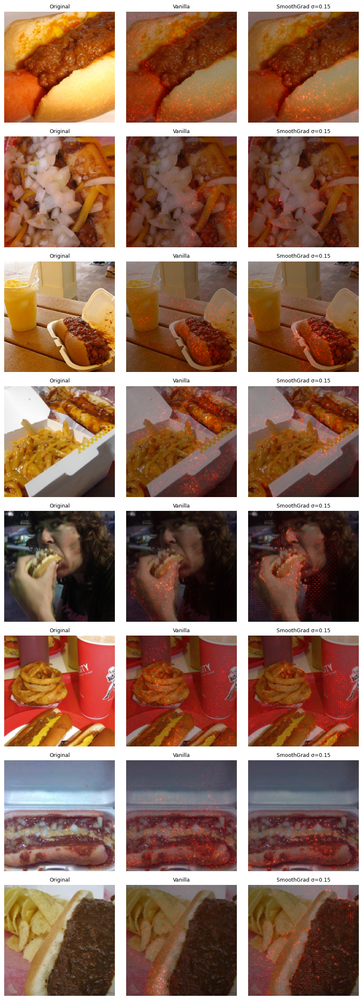

In [ ]:
# Cell 12 : saliency (vanilla + smoothgrad)
def denorm(img_chw, mean=TRAINSET_MEAN, std=TRAINSET_STD, enabled=True):
    x = img_chw.detach().cpu().clone()
    if enabled:
        for c, (m, s) in enumerate(zip(mean, std)):
            x[c] = x[c] * s + m
    return x.clamp(0, 1)

def saliency_map(model, img_tensor, target_class=None, take_abs=True, to_numpy=True):
    """
    Vanilla Saliency: d logit_c / d input
    """
    model.eval()
    device = next(model.parameters()).device
    with torch.enable_grad():                               # 显式打开梯度
        x = img_tensor.clone().to(device).unsqueeze(0)      # [1,C,H,W]
        x.requires_grad_(True)
        logits = model(x)                                   # [1,num_classes]
        cls = int(logits.argmax(1).item() if target_class is None else target_class)
        model.zero_grad(set_to_none=True)
        logits[0, cls].backward()                           # d logit_cls / d x
        g = x.grad.detach().squeeze(0)                      # [C,H,W]
    if take_abs:
        g = g.abs()
    sal = g.max(dim=0).values                               # [H,W]
    sal = (sal - sal.min())/(sal.max() + 1e-8)
    return (sal.cpu().numpy() if to_numpy else sal.cpu()), cls

def smoothgrad_saliency(model, img_tensor, target_class=None, n_samples=SALIENCY_N, sigma=SALIENCY_SIGMA):
    """
    SmoothGrad: 对输入多次加噪声，平均梯度。
    """
    model.eval()
    device = next(model.parameters()).device
    x0 = img_tensor.clone().to(device)

    # 先确定目标类别（用预测或用户指定）
    with torch.enable_grad():
        x_tmp = x0.unsqueeze(0).requires_grad_(True)
        logits = model(x_tmp)
        cls = int(logits.argmax(1).item() if target_class is None else target_class)

    acc = torch.zeros_like(x0)
    for _ in range(n_samples):
        with torch.enable_grad():
            xn = (x0 + torch.randn_like(x0)*sigma).clamp(0,1).unsqueeze(0)
            xn.requires_grad_(True)
            model.zero_grad(set_to_none=True)
            s = model(xn)[0, cls]
            s.backward()
            acc += xn.grad.detach().squeeze(0)

    g = acc / max(1, n_samples)
    g = g.abs().max(dim=0).values                           # [H,W]
    g = (g - g.min())/(g.max() + 1e-8)
    return g.cpu().numpy(), cls

def show_saliency_grid_compare(model, loader, class_names=None, k=SALIENCY_K, alpha=0.45, sigma=SALIENCY_SIGMA, n_samples=SALIENCY_N):
    """
    每张图显示：Original | Vanilla | SmoothGrad
    """
    X, y = next(iter(loader))
    k = min(k, X.size(0))
    rows, cols = k, 3
    plt.figure(figsize=(cols*3, rows*3))
    for i in range(k):
        img = X[i]
        van, _ = saliency_map(model, img)
        smg, _ = smoothgrad_saliency(model, img, n_samples=n_samples, sigma=sigma)
        vis = denorm(img).permute(1,2,0).numpy()

        ax = plt.subplot(rows, cols, i*3+1); ax.imshow(vis); ax.axis('off'); ax.set_title("Original", fontsize=9)
        ax = plt.subplot(rows, cols, i*3+2); ax.imshow(vis); ax.imshow(van, cmap='hot', alpha=alpha); ax.axis('off'); ax.set_title("Vanilla", fontsize=9)
        ax = plt.subplot(rows, cols, i*3+3); ax.imshow(vis); ax.imshow(smg, cmap='hot', alpha=alpha); ax.axis('off'); ax.set_title(f"SmoothGrad σ={sigma}", fontsize=9)
    plt.tight_layout(); plt.savefig(OUTDIR/"saliency_grid.png"); plt.show()

# 选择一个模型做可视化（保持你原来的逻辑）
_model_for_vis = model_res if 'model_res' in globals() else model_base
show_saliency_grid_compare(_model_for_vis, test_loader, class_names, k=SALIENCY_K, sigma=SALIENCY_SIGMA, n_samples=SALIENCY_N)
